# CSE602: Machine Learning - I

# Challenge 2

### Submitted by:
#### Name      : Muhammad Amin Ghias
#### ERP ID    : 25366

Date : 10th April 2022

# ML-1 Challenge 2: High Income Group Prediction

## Importing Libraries

In [3]:
import pandas as pd

import pandas as pd   
import matplotlib.pyplot as plt
import time

from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline
from matplotlib import pyplot

from numpy import mean
import pandas as pd

import warnings 
warnings.filterwarnings('ignore')


from sklearn.preprocessing import LabelEncoder
from mixed_naive_bayes import MixedNB
import numpy as np


import pandas as pd   
import matplotlib.pyplot as plt
import time

from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB, CategoricalNB, GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.model_selection import train_test_split, RepeatedKFold, GridSearchCV, cross_val_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

from sklearn.pipeline import Pipeline
from matplotlib import pyplot

from numpy import mean
import pandas as pd

import warnings 
warnings.filterwarnings('ignore')


from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.feature_selection import SequentialFeatureSelector
import os

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

from sklearn.preprocessing import PolynomialFeatures

from sklearn.linear_model import RidgeCV
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from numpy import arange
from sklearn.linear_model import LassoCV
import warnings 
warnings.filterwarnings('ignore')

from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from sklearn.feature_selection import SequentialFeatureSelector

from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor


from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from numpy import mean



cv = KFold(n_splits=10, random_state=1, shuffle=True)
reg = LinearRegression()


## Loading datasets

In [4]:
df=pd.read_csv("Training.csv")
df.head()


,row ID,Age,WorkClass,X1,Education Level,X2,Marital Status,Occupation,X3,Gender,X4,X5,Hours Per Week Working,Native Country,High Income
0,Row2,38.0,2,215646.0,1,9.0,2,2,0,0,0.0,0.0,40.0,0,0
1,Row3,53.0,2,234721.0,2,7.0,1,2,1,0,0.0,0.0,40.0,0,0
2,Row5,37.0,2,284582.0,3,14.0,1,1,0,1,0.0,0.0,40.0,0,0
3,Row7,52.0,1,209642.0,1,9.0,1,1,0,0,0.0,0.0,45.0,0,1
4,Row8,31.0,2,45781.0,3,14.0,0,3,0,1,14084.0,0.0,50.0,0,1


In [5]:
df.head()

,row ID,Age,WorkClass,X1,Education Level,X2,Marital Status,Occupation,X3,Gender,X4,X5,Hours Per Week Working,Native Country,High Income
0,Row2,38.0,2,215646.0,1,9.0,2,2,0,0,0.0,0.0,40.0,0,0
1,Row3,53.0,2,234721.0,2,7.0,1,2,1,0,0.0,0.0,40.0,0,0
2,Row5,37.0,2,284582.0,3,14.0,1,1,0,1,0.0,0.0,40.0,0,0
3,Row7,52.0,1,209642.0,1,9.0,1,1,0,0,0.0,0.0,45.0,0,1
4,Row8,31.0,2,45781.0,3,14.0,0,3,0,1,14084.0,0.0,50.0,0,1


In [ ]:
df.shape

(68378, 15)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68378 entries, 0 to 68377
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   row ID                  68378 non-null  object 
 1   Age                     68378 non-null  float64
 2   WorkClass               68378 non-null  int64  
 3   X1                      68378 non-null  float64
 4   Education Level         68378 non-null  int64  
 5   X2                      68378 non-null  float64
 6   Marital Status          68378 non-null  int64  
 7   Occupation              68378 non-null  int64  
 8   X3                      68378 non-null  int64  
 9   Gender                  68378 non-null  int64  
 10  X4                      68378 non-null  float64
 11  X5                      68378 non-null  float64
 12  Hours Per Week Working  68378 non-null  float64
 13  Native Country          68378 non-null  int64  
 14  High Income             68378 non-null

In [8]:
df.dtypes

row ID                     object
Age                       float64
WorkClass                   int64
X1                        float64
Education Level             int64
X2                        float64
Marital Status              int64
Occupation                  int64
X3                          int64
Gender                      int64
X4                        float64
X5                        float64
Hours Per Week Working    float64
Native Country              int64
High Income                 int64
dtype: object

In [9]:
df.describe()

,Age,WorkClass,X1,Education Level,X2,Marital Status,Occupation,X3,Gender,X4,X5,Hours Per Week Working,Native Country,High Income
count,68378.000000,68378.000000,6.837800e+04,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000,68378.000000
mean,43.292721,2.812966,3.518772e+05,4.622203,9.748831,1.653865,5.374989,0.756033,0.380883,15904.929798,709.622235,43.442473,7.028021,0.319679
std,16.913851,1.903760,3.595718e+05,4.249394,3.183975,1.747270,3.843540,1.239573,0.485607,28084.641539,1221.185320,18.565032,11.742503,0.466356
min,17.000000,0.000000,1.228500e+04,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,30.723923,2.000000,1.271510e+05,1.000000,9.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,36.721104,0.000000,0.000000
50%,40.114881,2.000000,2.009250e+05,4.000000,10.000000,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,40.000000,0.000000,0.000000
75%,52.666426,4.000000,3.880949e+05,7.000000,12.190965,2.000000,8.000000,1.000000,1.000000,18681.276836,1150.990390,50.000000,11.000000,1.000000
max,90.000000,8.000000,1.484705e+06,15.000000,16.000000,6.000000,14.000000,4.000000,1.000000,99999.000000,4356.000000,99.000000,41.000000,1.000000


In [10]:
df["Education Level"]

0         1
1         2
2         3
3         1
4         3
         ..
68373    10
68374     3
68375     1
68376     6
68377     1
Name: Education Level, Length: 68378, dtype: int64

In [11]:
df["High Income"].unique()

array([0, 1], dtype=int64)

In [12]:
df["X4"].unique()

array([    0.        , 14084.        ,  5178.        , ...,
       45237.87771527, 51480.33427881,  3668.66551754])

In [13]:
df1=df.copy()

## Changing categorical fields into string

In [14]:

df1['WorkClass'] = df1['WorkClass'].astype('str')

df1['Education Level'] = df1['Education Level'].astype('str')

df1['Marital Status'] = df1['Marital Status'].astype('str')

df1['Occupation'] = df1['Occupation'].astype('str')

df1['Gender'] = df1['Gender'].astype('str')

df1['Native Country'] = df1['Native Country'].astype('str')


df1['X3'] = df1['X3'].astype('str')

# Deleted row ID from df1
df1.drop(['row ID'], axis=1, inplace=True)

In [15]:
df1.dtypes

Age                       float64
WorkClass                  object
X1                        float64
Education Level            object
X2                        float64
Marital Status             object
Occupation                 object
X3                         object
Gender                     object
X4                        float64
X5                        float64
Hours Per Week Working    float64
Native Country             object
High Income                 int64
dtype: object

### Using onehot encoding

In [16]:
df_onehot = pd.get_dummies(df1)
df_onehot.dtypes

Age                 float64
X1                  float64
X2                  float64
X4                  float64
X5                  float64
                     ...   
Native Country_5      uint8
Native Country_6      uint8
Native Country_7      uint8
Native Country_8      uint8
Native Country_9      uint8
Length: 103, dtype: object

In [17]:
df_onehot.head()

,Age,X1,X2,X4,X5,Hours Per Week Working,High Income,WorkClass_0,WorkClass_1,WorkClass_2,...,Native Country_38,Native Country_39,Native Country_4,Native Country_40,Native Country_41,Native Country_5,Native Country_6,Native Country_7,Native Country_8,Native Country_9
0,38.0,215646.0,9.0,0.0,0.0,40.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,53.0,234721.0,7.0,0.0,0.0,40.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,37.0,284582.0,14.0,0.0,0.0,40.0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,52.0,209642.0,9.0,0.0,0.0,45.0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,31.0,45781.0,14.0,14084.0,0.0,50.0,1,0,0,1,...,0,0,0,0,0,0,0,0,0,0


### Finding correlation matrix

In [18]:
cor=df.corr()

In [19]:
cor

,Age,WorkClass,X1,Education Level,X2,Marital Status,Occupation,X3,Gender,X4,X5,Hours Per Week Working,Native Country,High Income
Age,1.000000,0.187376,0.284217,0.173447,-0.092781,0.338924,0.116163,0.251542,0.011503,0.328025,0.323690,0.117832,0.292643,0.239022
WorkClass,0.187376,1.000000,0.292226,0.176397,-0.106541,0.208594,0.196221,0.266566,0.072139,0.334193,0.320441,0.080150,0.304187,0.121755
X1,0.284217,0.292226,1.000000,0.320397,-0.202870,0.359149,0.203583,0.478177,0.108561,0.580482,0.567284,0.169005,0.545052,0.197972
Education Level,0.173447,0.176397,0.320397,1.000000,-0.212867,0.217855,0.158725,0.295111,0.067119,0.356009,0.344161,0.084554,0.341137,0.085128
X2,-0.092781,-0.106541,-0.202870,-0.212867,1.000000,-0.150031,-0.169656,-0.178362,-0.047432,-0.200674,-0.194802,-0.025962,-0.212538,0.045253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
X4,0.328025,0.334193,0.580482,0.356009,-0.200674,0.403353,0.219392,0.526971,0.116574,1.000000,0.624729,0.193399,0.598999,0.236825
X5,0.323690,0.320441,0.567284,0.344161,-0.194802,0.400821,0.218000,0.513215,0.113416,0.624729,1.000000,0.199259,0.589177,0.232313
Hours Per Week Working,0.117832,0.080150,0.169005,0.084554,-0.025962,0.114799,0.053034,0.148996,-0.052688,0.193399,0.199259,1.000000,0.174844,0.151728
Native Country,0.292643,0.304187,0.545052,0.341137,-0.212538,0.369219,0.208510,0.526143,0.119674,0.598999,0.589177,0.174844,1.000000,0.184611


In [20]:
df_onehot.shape

(68378, 103)

### Forming X and y of training data

In [21]:
dfX=df_onehot.copy()
dfX=dfX.drop(columns=['High Income'])
print(dfX.shape)
dfX.head()
X=dfX
X.head()
y=df_onehot['High Income']
y.head()

(68378, 102)


0    0
1    0
2    0
3    1
4    1
Name: High Income, dtype: int64

### loading testing data

In [22]:
df_test=pd.read_csv('Testing.csv')
df_test.head()

,row ID,Age,WorkClass,X1,Education Level,X2,Marital Status,Occupation,X3,Gender,X4,X5,Hours Per Week Working,Native Country
0,Row0,21.274154,2,344747.401671,12,6.264124,2,1,0,0,46294.933555,328.330267,90.641687,32
1,Row1,50.000000,1,83311.000000,0,13.000000,1,1,0,0,0.000000,0.000000,13.000000,0
2,Row4,28.000000,2,338409.000000,0,13.000000,1,3,1,1,0.000000,0.000000,40.000000,1
3,Row6,49.000000,2,160187.000000,4,5.000000,3,4,1,1,0.000000,0.000000,16.000000,2
4,Row10,37.000000,2,280464.000000,5,10.000000,1,1,1,0,0.000000,0.000000,80.000000,0


In [23]:

df_test['WorkClass'] = df_test['WorkClass'].astype('str')

df_test['Education Level'] = df_test['Education Level'].astype('str')

df_test['Marital Status'] = df_test['Marital Status'].astype('str')

df_test['Occupation'] = df_test['Occupation'].astype('str')

df_test['Gender'] = df_test['Gender'].astype('str')

df_test['Native Country'] = df_test['Native Country'].astype('str')


df_test['X3'] = df_test['X3'].astype('str')

df_test.drop(['row ID'], axis=1, inplace=True)

In [24]:
df_onehot_test = pd.get_dummies(df_test)
df_onehot_test.dtypes

Age                 float64
X1                  float64
X2                  float64
X4                  float64
X5                  float64
                     ...   
Native Country_5      uint8
Native Country_6      uint8
Native Country_7      uint8
Native Country_8      uint8
Native Country_9      uint8
Length: 102, dtype: object

### Forming X for testing data

In [25]:

dfXt=df_onehot_test.copy()
print(dfXt.shape)
dfXt.head()

Xt=dfXt
Xt.head()

(29305, 102)


,Age,X1,X2,X4,X5,Hours Per Week Working,WorkClass_0,WorkClass_1,WorkClass_2,WorkClass_3,...,Native Country_38,Native Country_39,Native Country_4,Native Country_40,Native Country_41,Native Country_5,Native Country_6,Native Country_7,Native Country_8,Native Country_9
0,21.274154,344747.401671,6.264124,46294.933555,328.330267,90.641687,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
1,50.000000,83311.000000,13.000000,0.000000,0.000000,13.000000,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,28.000000,338409.000000,13.000000,0.000000,0.000000,40.000000,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,49.000000,160187.000000,5.000000,0.000000,0.000000,16.000000,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,37.000000,280464.000000,10.000000,0.000000,0.000000,80.000000,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [26]:
X.shape

(68378, 102)

In [27]:
Xt.shape

(29305, 102)

## Top 5 best Models

### First best Model

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=3000,max_features=20,verbose=2)

gb400.fit(X,y)

y_pred_test_df = gb400.predict(Xt)


md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)

Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o50p.csv',index=False)
prd1.to_csv('o50y.csv',index=False)
prdb.to_csv('o50.csv',index=False)



      Iter       Train Loss   Remaining Time 
         1           1.1599           36.20m
         2           1.0819           36.63m
         3           1.0114           37.82m
         4           0.9558           38.59m
         5           0.9016           40.12m
         6           0.8534           39.73m
         7           0.8148           40.18m
         8           0.7748           40.66m
         9           0.7427           40.45m
        10           0.7096           41.30m
        11           0.6822           41.23m
        12           0.6583           40.91m
        13           0.6349           40.96m
        14           0.6137           41.10m
        15           0.5931           41.38m
        16           0.5716           41.57m
        17           0.5559           41.31m
        18           0.5369           41.23m
        19           0.5238           40.96m
        20           0.5098           41.00m
        21           0.4956           40.82m
        2

### 2nd Best model

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=3200,max_features=30,verbose=2)

gb400.fit(X,y)
y_pred_test_df = gb400.predict(Xt)
md_probs = gb400.predict_proba(Xt)
b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)

Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o56p.csv',index=False)
prd1.to_csv('o56y.csv',index=False)
prdb.to_csv('o56.csv',index=False)




# Xto=pd.read_csv('Testing.csv')
# ro=Xto['row ID']
# type(ro)
# row=ro.values

# prd=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

# prd
# prd.head()

# prd.to_csv('o33.csv',index=False)

      Iter       Train Loss   Remaining Time 
         1           1.1476           51.45m
         2           1.0659           53.82m
         3           0.9981           56.81m
         4           0.9396           61.95m
         5           0.8875           59.35m
         6           0.8395           58.17m
         7           0.8009           57.51m
         8           0.7684           57.13m
         9           0.7359           57.42m
        10           0.7049           59.43m
        11           0.6779           59.11m
        12           0.6495           61.56m
        13           0.6238           62.82m
        14           0.6018           62.69m
        15           0.5802           63.96m
        16           0.5601           66.44m
        17           0.5445           66.64m
        18           0.5295           66.51m
        19           0.5126           66.13m
        20           0.4975           65.82m
        21           0.4832           65.68m
        2

### 3rd best model

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=2700,verbose=2)

gb400.fit(X,y)

y_pred_test_df = gb400.predict(Xt)

md_probs = gb400.predict_proba(Xt)
b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)

Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o48p.csv',index=False)
prd1.to_csv('o48y.csv',index=False)
prdb.to_csv('o48.csv',index=False)


### 4th best model

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=2500,verbose=2)

gb400.fit(X,y)



y_pred_test_df = gb400.predict(Xt)


md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)



Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o41p.csv',index=False)
prd1.to_csv('o41y.csv',index=False)
prdb.to_csv('o41.csv',index=False)



      Iter       Train Loss   Remaining Time 
         1           1.1476           41.33m
         2           1.0646           41.09m
         3           0.9887           43.10m
         4           0.9282           44.55m
         5           0.8752           44.46m
         6           0.8322           44.83m
         7           0.7915           45.63m
         8           0.7557           47.33m
         9           0.7238           47.31m
        10           0.6928           47.41m
        11           0.6670           47.46m
        12           0.6423           47.78m
        13           0.6183           48.04m
        14           0.5999           47.99m
        15           0.5805           48.23m
        16           0.5657           48.14m
        17           0.5480           48.29m
        18           0.5345           48.40m
        19           0.5205           48.37m
        20           0.5072           48.36m
        21           0.4952           48.53m
        2

PermissionError: [Errno 13] Permission denied: 'o40.csv'

### 5th best model

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=2000,verbose=2)

gb400.fit(X,y)

y_pred_test_df = gb400.predict(Xt)

md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)


Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o46p.csv',index=False)
prd1.to_csv('o46y.csv',index=False)
prdb.to_csv('o46.csv',index=False)

      Iter       Train Loss   Remaining Time 
         1           1.1476           36.44m
         2           1.0648           39.07m
         3           0.9882           40.76m
         4           0.9279           43.02m
         5           0.8749           43.75m
         6           0.8309           43.42m
         7           0.7898           45.60m
         8           0.7514           47.82m
         9           0.7186           49.31m
        10           0.6918           51.50m
        11           0.6652           50.48m
        12           0.6370           49.93m
        13           0.6139           49.29m
        14           0.5942           48.79m
        15           0.5754           48.25m
        16           0.5594           48.05m
        17           0.5414           47.74m
        18           0.5245           47.45m
        19           0.5126           47.30m
        20           0.5007           47.10m
        21           0.4879           47.04m
        2

### Taking mean of our top 5 best models results

In [ ]:
Xtst['average'] = Xtst.mean(axis=1)

In [ ]:
Xtst.head()

,s1,s2,s3,s4,s5,average
0,4.969837e-01,3.011290e-02,2.143841e-02,8.879065e-01,5.957155e-01,4.064314e-01
1,4.160000e-10,4.170000e-10,1.560000e-09,2.120000e-09,2.640000e-09,1.430600e-09
2,4.990000e-09,3.450000e-09,8.670000e-09,9.720000e-09,1.470000e-08,8.306000e-09
3,3.140000e-10,9.920000e-11,1.180000e-09,5.190000e-11,6.530000e-10,4.596200e-10
4,6.974059e-01,1.265695e-01,8.530460e-01,9.810692e-01,5.837497e-01,6.483680e-01


In [ ]:
Xto=pd.read_csv('xts.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': Xtst['average']}, index=None)


prd
prd.head()

prd.to_csv('o63.csv',index=False)



In [ ]:
hc=pd.read_csv('o50 - Copy.csv')
hc.head()
hc1=hc.drop(columns=['High Income1','High Income2','High Income3','High Income4','High Income5'])
hc1.head()
hc1.to_csv('oavg.csv',index=False)

# Background Work and Analysis

## Filtering Methods

In [42]:
#  Removing of self correlation

# This  function will find correlation feateures with each other and tell feaure with are highly correlataed nearly same which can be removed

def self_corr(cormatrix,low_range,high_range):

    cor=cormatrix


    fcr_df=pd.DataFrame(columns= ['feature 1', 'feature 2', 'correlation values'])
    l=len(cor)
    fcor_rem=[]
    l
    for j in range(l):
        for k in range(l):
            fcor=cor.iloc[j-1,k-1]

            if fcor>=low_range and fcor <high_range:

                
                f2=cor.index[j-1]
                f3=cor.columns[k-1]

                
                fcor_rem.append([f2, f3, fcor])
                fcr_df=fcr_df.append({'feature 1': f2, 'feature 2' : f3, 'correlation values': fcor}, ignore_index=True)
                


    fcr12=fcr_df.copy()

    for i in range(len(fcr12)):
        for j in range(len(fcr12)):
            try:

                if fcr12.iloc[j,0]==fcr12.iloc[i,1]:
                    fcr12=fcr12.drop(j)
            except:
                    

             fcr12 =fcr12.reset_index(drop=True)

    print(fcr_df.head())
    return(fcr12['feature 1'])
        



In [43]:
#  Removing of features on correlation with target variable

# if feature has very low correlation with target variable it can be neglected


def target_cor(cor_matrix,target_feature,lower_limit):

    cor= cor_matrix


    cor_target = abs(cor[target_feature])

    #Selecting highly correlated features
    relevant_features = cor_target[cor_target<lower_limit]
    print(relevant_features)
    return(relevant_features.index)

In [44]:
## Removing features with low self variance

## Features whcih remain constant can have no effect on predicting targert feature and can be removed

def self_var(dataset,limit):

    var=dataset.var()
    var_rem= var[var<limit]
    print(var_rem)
    return(var_rem.index)

    

In [45]:
def remove_features(dataset,rem_feature):

    for i in rem_feature:
        try:
            dataset=dataset.drop(columns= i)
            dataset=dataset.reset_index(drop=True)

            print(dataset.shape)

        except:
            print('Missing')

    return(dataset)

In [46]:
# This will remove features based on higher p-values

def p_val(dataset):

    p= len(dataset.columns)
    n= len(dataset.index)

    print(dataset.shape)
    Xsm=dataset.copy()
    Xsm = sm.add_constant(dataset)
    print(dataset.shape)
    mod = sm.OLS(y, Xsm)
    res = mod.fit()
    # # print(res.summary())

    ar=pd.DataFrame(columns = ['Features', 'P_Values'])
    c=[]
    for l in Xsm.columns:
        b = res.pvalues[l]
        if b > 0.05:

            ar= ar.append({'Features': l, 'P_Values': b},ignore_index=True)
            c.append(l)
            print(l,':',b)
    print(c)
    # ar.head(30)

    return(c)



In [47]:
def scaling(dataset):
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler(feature_range=(0, 1))
    X2_Scaled = scaler.fit_transform(dataset)
    X2df_Scaled = pd.DataFrame(X2_Scaled)
    X2df_Scaled.columns = dataset.columns
    return(X2df_Scaled)

In [48]:


rem_selfcor =self_corr(cor,0.9,1)

rem_cor=target_cor(cor,'High Income',0.1)

rem_var=self_var(X,0.1)

rem_p=p_val(X)

X2=remove_features(X,rem_cor)

X2=remove_features(X2,rem_selfcor)

X2=remove_features(X2,rem_var)

X2=remove_features(X2,rem_p)

X2t=Xt[X2.columns]



NumExpr defaulting to 8 threads.


Empty DataFrame
Columns: [feature 1, feature 2, correlation values]
Index: []
Education Level    0.085128
X2                 0.045253
Occupation         0.012444
Gender             0.096204
Name: High Income, dtype: float64
WorkClass_0         0.056752
WorkClass_1         0.079832
WorkClass_3         0.052083
WorkClass_4         0.072885
WorkClass_5         0.066175
                      ...   
Native Country_5    0.020602
Native Country_6    0.009215
Native Country_7    0.008971
Native Country_8    0.007561
Native Country_9    0.008971
Length: 84, dtype: float64
(68378, 102)
(68378, 102)
WorkClass_0 : 0.5730696733407772
WorkClass_7 : 0.271723546285651
Education Level_13 : 0.5580852488355847
Education Level_14 : 0.6361234010750867
Education Level_6 : 0.7491663376292224
Education Level_7 : 0.7828956525539508
Marital Status_3 : 0.4132811150204295
Marital Status_6 : 0.15916721726621832
Occupation_0 : 0.05215240892691508
Occupation_13 : 0.7341021859372192
Occupation_14 : 0.7241825665533446

In [51]:
X2.shape

(68378, 16)

## Applying different models on train data with all features using train_test split

In [55]:
trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3, random_state=2)

def fit_model(model, model_name):
    model.fit(trainX,trainy)
    md_probs = model.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print(model_name, " : ", md_auc)
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    pyplot.plot(md_fpr, md_tpr, marker='.', label=model_name)
    #return (md_fpr, md_tpr)

Logistic  :  0.5198236084149601
Decision Tree  :  0.836374728092627
Random Forest  :  0.8311080809430372
Graident Boosting  :  0.8453269699803782
k-NN  :  0.7383664304969388
Scaled k-NN  :  0.8090227020279421


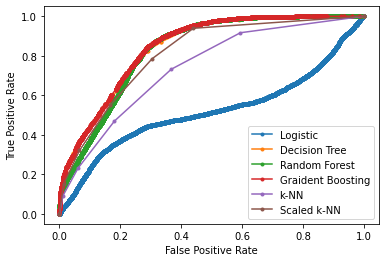

In [56]:
lr = LogisticRegression()
fit_model(lr, "Logistic")

dt = DecisionTreeClassifier(max_depth=5)  
fit_model(dt, "Decision Tree") 

rf = RandomForestClassifier(max_depth=5,n_estimators=50)
fit_model(rf, "Random Forest")

gb = GradientBoostingClassifier(max_depth=2,n_estimators=50)
fit_model(gb, "Graident Boosting")

kn = KNeighborsClassifier(n_neighbors=5)
fit_model(kn, "k-NN")

pipe_kn = Pipeline([("scaler", MinMaxScaler()), ("knr", KNeighborsClassifier(n_neighbors=5))])
fit_model(pipe_kn, "Scaled k-NN")

pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

## results with varried parameters

Logistic  :  0.5198236084149601
Decision Tree  :  0.836374728092627


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 300
building tree 2 of 300
building tree 3 of 300
building tree 4 of 300
building tree 5 of 300
building tree 6 of 300
building tree 7 of 300
building tree 8 of 300
building tree 9 of 300
building tree 10 of 300
building tree 11 of 300
building tree 12 of 300
building tree 13 of 300
building tree 14 of 300
building tree 15 of 300
building tree 16 of 300
building tree 17 of 300
building tree 18 of 300
building tree 19 of 300
building tree 20 of 300
building tree 21 of 300
building tree 22 of 300
building tree 23 of 300
building tree 24 of 300
building tree 25 of 300
building tree 26 of 300
building tree 27 of 300
building tree 28 of 300
building tree 29 of 300
building tree 30 of 300
building tree 31 of 300
building tree 32 of 300
building tree 33 of 300
building tree 34 of 300
building tree 35 of 300
building tree 36 of 300
building tree 37 of 300
building tree 38 of 300
building tree 39 of 300
building tree 40 of 300
building tree 41 of 300
building tree 42 of 300
b

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    9.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:    0.3s finished


Random Forest  :  0.8320225291249801
      Iter       Train Loss   Remaining Time 
         1           1.1633           10.84m
         2           1.0914           11.03m
         3           1.0312           11.09m
         4           0.9812           11.11m
         5           0.9356           11.06m
         6           0.8975           10.95m
         7           0.8635           11.06m
         8           0.8345           10.97m
         9           0.8092           11.11m
        10           0.7855           11.10m
        11           0.7619           11.14m
        12           0.7429           11.14m
        13           0.7219           11.18m
        14           0.7060           11.14m
        15           0.6904           11.14m
        16           0.6777           11.12m
        17           0.6659           11.10m
        18           0.6524           11.10m
        19           0.6407           11.11m
        20           0.6289           11.12m
        21       

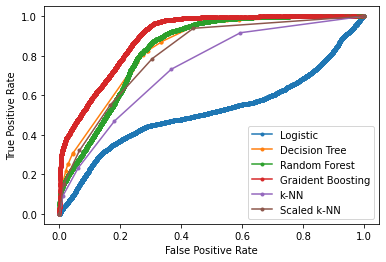

In [59]:
lr = LogisticRegression()
fit_model(lr, "Logistic")

dt = DecisionTreeClassifier(max_depth=5)  
fit_model(dt, "Decision Tree") 

rf = RandomForestClassifier(verbose=2, max_depth=5,n_estimators=300)
fit_model(rf, "Random Forest")

gb = GradientBoostingClassifier(verbose=2,max_depth=12,n_estimators=1000)
fit_model(gb, "Graident Boosting")

kn = KNeighborsClassifier(n_neighbors=5)
fit_model(kn, "k-NN")

pipe_kn = Pipeline([("scaler", MinMaxScaler()), ("knr", KNeighborsClassifier(n_neighbors=5))])
fit_model(pipe_kn, "Scaled k-NN")

pyplot.xlabel('False Positive Rate')
pyplot.ylabel('True Positive Rate')
# show the legend
pyplot.legend()
# show the plot
pyplot.show()

## Finding Important features with Random Forrest Classifier

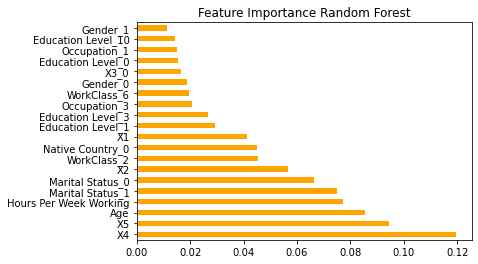

In [60]:
clfRF = RandomForestClassifier(max_depth=5, max_features=4, min_samples_split=8,
                      n_estimators=100)#, random_state=0)
clfRF.fit(trainX, trainy)
importance_rf = pd.Series(clfRF.feature_importances_, index=trainX.columns)
importance_rf_sorted = importance_rf.sort_values()
importance_rf_sorted.nlargest(20).plot(kind='barh', color='orange')
plt.title("Feature Importance Random Forest")
plt.show()

In [61]:
import sklearn
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'top_k_accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_wei

In [62]:
def fitting_models_CV2():
    cv = RepeatedKFold(n_splits=10, n_repeats=1)#, random_state=1)
    
    lr=LogisticRegression()
    dt = DecisionTreeClassifier(max_depth=5)    
    rf = RandomForestClassifier(max_depth=5,n_estimators=50)
    gb = GradientBoostingClassifier(max_depth=2,n_estimators=50)
    kn = KNeighborsClassifier(n_neighbors=5)
    pipe_kn = Pipeline([("scaler", MinMaxScaler()), 
                         ("knr", KNeighborsClassifier(n_neighbors=5))])
    clfs = [('Logistic Regression', lr),        
        ('Decision Tree', dt),        
        ('Random Forest', rf),
        ('Gradient Boosting', gb),
        ('KNearest Neighbor',kn),
        ('Scaled KNearest',pipe_kn)       
    ]
    for name,clf in clfs:
        start = time.perf_counter()
        #scores = cross_val_score(clf, X, y, scoring="accuracy", cv=cv) 
        scores = cross_val_score(clf, X, y, scoring="roc_auc", cv=cv) 
        end = time.perf_counter()        
        score = format(mean(scores), '.4f')
        duration = format((end-start),'.4f')
        print("{} : {} - {}".format(name,score,duration))

### Trying to find best parameters of gradient boosting

In [27]:
n= [1000, 1200, 1500]

for i in n:
    print(i)

    trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3, random_state=2)

    gb = GradientBoostingClassifier(verbose=2, max_depth=12,n_estimators=i)

    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Graident Boosting, max_depth: " , 16 ," : ", md_auc)
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)



1000
      Iter       Train Loss   Remaining Time 
         1           1.1632           11.95m
         2           1.0914           11.97m
         3           1.0314           12.13m
         4           0.9815           12.17m
         5           0.9382           12.07m
         6           0.9006           12.11m
         7           0.8672           12.11m
         8           0.8375           12.14m
         9           0.8093           12.03m
        10           0.7849           11.93m
        11           0.7644           11.82m
        12           0.7431           11.79m
        13           0.7263           11.74m
        14           0.7079           11.70m
        15           0.6925           11.69m
        16           0.6792           11.64m
        17           0.6645           11.60m
        18           0.6504           11.57m
        19           0.6410           11.52m
        20           0.6307           11.47m
        21           0.6206           11.43m
    

## Gradient boosting

In [30]:
gb400 = GradientBoostingClassifier(max_depth=20,n_estimators=2500,verbose=2)

gb400.fit(X,y)



y_pred_test_df = gb400.predict(Xt)


Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o29.csv',index=False)

      Iter       Train Loss   Remaining Time 
         1           1.1299           91.83m
         2           1.0342          148.45m
         3           0.9530          177.41m
         4           0.8760          199.51m
         5           0.8165          211.14m
         6           0.7594          197.40m
         7           0.7104          185.50m
         8           0.6722          177.75m
         9           0.6299          171.58m
        10           0.5936          166.27m
        11           0.5588          162.16m
        12           0.5333          158.05m
        13           0.5062          155.43m
        14           0.4825          153.32m
        15           0.4596          151.30m
        16           0.4399          149.61m
        17           0.4223          147.94m
        18           0.4029          147.07m
        19           0.3874          145.55m
        20           0.3684          144.94m
        21           0.3536          143.95m
        2

## Decission Tree

In [28]:
gb400 = dt = DecisionTreeClassifier(max_depth=25)

gb400.fit(X,y)



y_pred_test_df = gb400.predict(Xt)


Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o30.csv',index=False)

### Forming a dataframe to store results of AUC socre on train data with different parameters of Decission Tree Classifier

In [31]:
results=pd.DataFrame(columns=['Name','depth','estimators','AUC'])

results.head()

,Name,depth,estimators,AUC


In [37]:

trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3, random_state=2)
name= "Decission Tree"
n='na'
i= range(1,100)


for d in i:
    print(d)

    gb = dt = DecisionTreeClassifier(max_depth=d)

    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Decission Tree ", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    results=results.append({'Name':name,
                   'depth': d,'estimators': n,'AUC':s}, ignore_index=True) 

results.head()

1
Graident Boosting, max_depth: :  0.6687411092510944
2
Graident Boosting, max_depth: :  0.7674980526585578
3
Graident Boosting, max_depth: :  0.8009740855136135
4
Graident Boosting, max_depth: :  0.8217858332656566
5
Graident Boosting, max_depth: :  0.836374728092627
6
Graident Boosting, max_depth: :  0.8486760588778248
7
Graident Boosting, max_depth: :  0.8538935149163736
8
Graident Boosting, max_depth: :  0.8582222235320931
9
Graident Boosting, max_depth: :  0.8564904650129109
10
Graident Boosting, max_depth: :  0.8553812553977599
11
Graident Boosting, max_depth: :  0.8506478294128897
12
Graident Boosting, max_depth: :  0.8449455355669253
13
Graident Boosting, max_depth: :  0.8414902161374352
14
Graident Boosting, max_depth: :  0.8353112548039515
15
Graident Boosting, max_depth: :  0.8255851411735222
16
Graident Boosting, max_depth: :  0.817361946153826
17
Graident Boosting, max_depth: :  0.8118889397555431
18
Graident Boosting, max_depth: :  0.8060175251997335
19
Graident Boosting,

,Name,depth,estimators,AUC
0,Decission Tree,1,na,0.668741
1,Decission Tree,2,na,0.767498
2,Decission Tree,3,na,0.800974
3,Decission Tree,4,na,0.821786
4,Decission Tree,5,na,0.836375


### Forming a dataframe to store results of AUC socre on train data with different parameters of Random Classifier

In [43]:
results2=pd.DataFrame(columns=['Name','depth','estimators','AUC'])

results2.head()

,Name,depth,estimators,AUC


In [44]:

name= "RandomForestClassifier"
n=100
i= range(1,100)

for d in i:
    print(d)
    gb = dt = RandomForestClassifier(max_depth=d,n_estimators=n)
    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Random Forrest Classifier", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    results2=results2.append({'Name':name,
                   'depth': d,'estimators': n,'AUC':s}, ignore_index=True) 

results2.head()

1
Graident Boosting, max_depth: :  0.7872018788351931
2
Graident Boosting, max_depth: :  0.7977521250472644
3
Graident Boosting, max_depth: :  0.8083308445785752
4
Graident Boosting, max_depth: :  0.8215047895430384
5
Graident Boosting, max_depth: :  0.8324763120758747
6
Graident Boosting, max_depth: :  0.8382712083384637
7
Graident Boosting, max_depth: :  0.8449806673967014
8
Graident Boosting, max_depth: :  0.8520760198873336
9
Graident Boosting, max_depth: :  0.8544109248474656
10
Graident Boosting, max_depth: :  0.8584470628764241
11
Graident Boosting, max_depth: :  0.8631936639796848
12
Graident Boosting, max_depth: :  0.8660330438955212
13
Graident Boosting, max_depth: :  0.8700717416305797
14
Graident Boosting, max_depth: :  0.8706216800229838
15
Graident Boosting, max_depth: :  0.8728650195476404
16
Graident Boosting, max_depth: :  0.8747204680867414
17
Graident Boosting, max_depth: :  0.8780389496668998
18
Graident Boosting, max_depth: :  0.8790492858583714
19
Graident Boostin

,Name,depth,estimators,AUC
0,RandomForestClassifier,1,100,0.787202
1,RandomForestClassifier,2,100,0.797752
2,RandomForestClassifier,3,100,0.808331
3,RandomForestClassifier,4,100,0.821505
4,RandomForestClassifier,5,100,0.832476


In [45]:
results2.sort_values(by=['AUC'],ascending=False)

,Name,depth,estimators,AUC
29,RandomForestClassifier,30,100,0.892559
33,RandomForestClassifier,34,100,0.892470
34,RandomForestClassifier,35,100,0.892142
43,RandomForestClassifier,44,100,0.892048
70,RandomForestClassifier,71,100,0.892047
...,...,...,...,...
4,RandomForestClassifier,5,100,0.832476
3,RandomForestClassifier,4,100,0.821505
2,RandomForestClassifier,3,100,0.808331
1,RandomForestClassifier,2,100,0.797752


In [46]:
c= [200, 400, 600, 800, 1000]
name= "RandomForestClassifier"
n=100
d=30


for n in c:
    print(n)

    gb = dt = RandomForestClassifier(verbose=2, max_depth=d,n_estimators=n)
    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Random Forrest Classifier", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    results2=results2.append({'Name':name,
                   'depth': d,'estimators': n,'AUC':s}, ignore_index=True) 

results2.head()

200
building tree 1 of 200


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   26.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    1.0s finished


Graident Boosting, max_depth: :  0.89193072572962
400


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


building tree 1 of 400
building tree 2 of 400
building tree 3 of 400
building tree 4 of 400
building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400
building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
b

[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:   54.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 400 out of 400 | elapsed:    2.4s finished


Graident Boosting, max_depth: :  0.89171133326522
600


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 600
building tree 2 of 600
building tree 3 of 600
building tree 4 of 600
building tree 5 of 600
building tree 6 of 600
building tree 7 of 600
building tree 8 of 600
building tree 9 of 600
building tree 10 of 600
building tree 11 of 600
building tree 12 of 600
building tree 13 of 600
building tree 14 of 600
building tree 15 of 600
building tree 16 of 600
building tree 17 of 600
building tree 18 of 600
building tree 19 of 600
building tree 20 of 600
building tree 21 of 600
building tree 22 of 600
building tree 23 of 600
building tree 24 of 600
building tree 25 of 600
building tree 26 of 600
building tree 27 of 600
building tree 28 of 600
building tree 29 of 600
building tree 30 of 600
building tree 31 of 600
building tree 32 of 600
building tree 33 of 600
building tree 34 of 600
building tree 35 of 600
building tree 36 of 600
building tree 37 of 600
building tree 38 of 600
building tree 39 of 600
building tree 40 of 600
building tree 41 of 600
building tree 42 of 600
b

[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 600 out of 600 | elapsed:    3.7s finished


Graident Boosting, max_depth: :  0.8919800532855493
800


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


building tree 1 of 800
building tree 2 of 800
building tree 3 of 800
building tree 4 of 800
building tree 5 of 800
building tree 6 of 800
building tree 7 of 800
building tree 8 of 800
building tree 9 of 800
building tree 10 of 800
building tree 11 of 800
building tree 12 of 800
building tree 13 of 800
building tree 14 of 800
building tree 15 of 800
building tree 16 of 800
building tree 17 of 800
building tree 18 of 800
building tree 19 of 800
building tree 20 of 800
building tree 21 of 800
building tree 22 of 800
building tree 23 of 800
building tree 24 of 800
building tree 25 of 800
building tree 26 of 800
building tree 27 of 800
building tree 28 of 800
building tree 29 of 800
building tree 30 of 800
building tree 31 of 800
building tree 32 of 800
building tree 33 of 800
building tree 34 of 800
building tree 35 of 800
building tree 36 of 800
building tree 37 of 800
building tree 38 of 800
building tree 39 of 800
building tree 40 of 800
building tree 41 of 800
building tree 42 of 800
b

[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:    3.7s finished


Graident Boosting, max_depth: :  0.8917961583232256
1000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:  1.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Graident Boosting, max_depth: :  0.892507107141329


[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    4.7s finished


,Name,depth,estimators,AUC
0,RandomForestClassifier,1,100,0.787202
1,RandomForestClassifier,2,100,0.797752
2,RandomForestClassifier,3,100,0.808331
3,RandomForestClassifier,4,100,0.821505
4,RandomForestClassifier,5,100,0.832476


In [47]:
results2.tail()

,Name,depth,estimators,AUC
99,RandomForestClassifier,30,200,0.891931
100,RandomForestClassifier,30,400,0.891711
101,RandomForestClassifier,30,600,0.891980
102,RandomForestClassifier,30,800,0.891796
103,RandomForestClassifier,30,1000,0.892507


In [48]:
results2.sort_values(by=['AUC'],ascending=False)

,Name,depth,estimators,AUC
29,RandomForestClassifier,30,100,0.892559
103,RandomForestClassifier,30,1000,0.892507
33,RandomForestClassifier,34,100,0.892470
34,RandomForestClassifier,35,100,0.892142
43,RandomForestClassifier,44,100,0.892048
...,...,...,...,...
4,RandomForestClassifier,5,100,0.832476
3,RandomForestClassifier,4,100,0.821505
2,RandomForestClassifier,3,100,0.808331
1,RandomForestClassifier,2,100,0.797752


In [57]:
c= [1200, 1500, 1800, 2200, 2600, 3000]
# trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3, random_state=2)
name= "RandomForestClassifier"
# n=100
# i= range(1,100)
d='na'


for n in c:
    print(n)

    # trainX, testX, trainy, testy = train_test_split(X, y, test_size=0.3, random_state=2)

    gb = dt = RandomForestClassifier(verbose=2, n_estimators=n)

        # fit_model(gb, "Graident Boosting")

    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Graident Boosting, max_depth: : ", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    results2=results2.append({'Name':name,
                   'depth': d,'estimators': n,'AUC':s}, ignore_index=True) 

# results2.head()


results2.sort_values(by=['AUC'],ascending=False)

1200


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1200
building tree 2 of 1200
building tree 3 of 1200
building tree 4 of 1200
building tree 5 of 1200
building tree 6 of 1200
building tree 7 of 1200
building tree 8 of 1200
building tree 9 of 1200
building tree 10 of 1200
building tree 11 of 1200
building tree 12 of 1200
building tree 13 of 1200
building tree 14 of 1200
building tree 15 of 1200
building tree 16 of 1200
building tree 17 of 1200
building tree 18 of 1200
building tree 19 of 1200
building tree 20 of 1200
building tree 21 of 1200
building tree 22 of 1200
building tree 23 of 1200
building tree 24 of 1200
building tree 25 of 1200
building tree 26 of 1200
building tree 27 of 1200
building tree 28 of 1200
building tree 29 of 1200
building tree 30 of 1200
building tree 31 of 1200
building tree 32 of 1200
building tree 33 of 1200
building tree 34 of 1200
building tree 35 of 1200
building tree 36 of 1200
building tree 37 of 1200
building tree 38 of 1200
building tree 39 of 1200
building tree 40 of 1200
building 

[Parallel(n_jobs=1)]: Done 1200 out of 1200 | elapsed:  2.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1200 out of 1200 | elapsed:    5.4s finished


Graident Boosting, max_depth: :  0.8916970993344984
1500


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1500
building tree 2 of 1500
building tree 3 of 1500
building tree 4 of 1500
building tree 5 of 1500
building tree 6 of 1500
building tree 7 of 1500
building tree 8 of 1500
building tree 9 of 1500
building tree 10 of 1500
building tree 11 of 1500
building tree 12 of 1500
building tree 13 of 1500
building tree 14 of 1500
building tree 15 of 1500
building tree 16 of 1500
building tree 17 of 1500
building tree 18 of 1500
building tree 19 of 1500
building tree 20 of 1500
building tree 21 of 1500
building tree 22 of 1500
building tree 23 of 1500
building tree 24 of 1500
building tree 25 of 1500
building tree 26 of 1500
building tree 27 of 1500
building tree 28 of 1500
building tree 29 of 1500
building tree 30 of 1500
building tree 31 of 1500
building tree 32 of 1500
building tree 33 of 1500
building tree 34 of 1500
building tree 35 of 1500
building tree 36 of 1500
building tree 37 of 1500
building tree 38 of 1500
building tree 39 of 1500
building tree 40 of 1500
building 

[Parallel(n_jobs=1)]: Done 1500 out of 1500 | elapsed:  2.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1500 out of 1500 | elapsed:    6.9s finished


Graident Boosting, max_depth: :  0.8920775240557794
1800


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1800
building tree 2 of 1800
building tree 3 of 1800
building tree 4 of 1800
building tree 5 of 1800
building tree 6 of 1800
building tree 7 of 1800
building tree 8 of 1800
building tree 9 of 1800
building tree 10 of 1800
building tree 11 of 1800
building tree 12 of 1800
building tree 13 of 1800
building tree 14 of 1800
building tree 15 of 1800
building tree 16 of 1800
building tree 17 of 1800
building tree 18 of 1800
building tree 19 of 1800
building tree 20 of 1800
building tree 21 of 1800
building tree 22 of 1800
building tree 23 of 1800
building tree 24 of 1800
building tree 25 of 1800
building tree 26 of 1800
building tree 27 of 1800
building tree 28 of 1800
building tree 29 of 1800
building tree 30 of 1800
building tree 31 of 1800
building tree 32 of 1800
building tree 33 of 1800
building tree 34 of 1800
building tree 35 of 1800
building tree 36 of 1800
building tree 37 of 1800
building tree 38 of 1800
building tree 39 of 1800
building tree 40 of 1800
building 

[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed:  3.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1800 out of 1800 | elapsed:    8.1s finished


Graident Boosting, max_depth: :  0.8919602906079634
2200


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 2200
building tree 2 of 2200
building tree 3 of 2200
building tree 4 of 2200
building tree 5 of 2200
building tree 6 of 2200
building tree 7 of 2200
building tree 8 of 2200
building tree 9 of 2200
building tree 10 of 2200
building tree 11 of 2200
building tree 12 of 2200
building tree 13 of 2200
building tree 14 of 2200
building tree 15 of 2200
building tree 16 of 2200
building tree 17 of 2200
building tree 18 of 2200
building tree 19 of 2200
building tree 20 of 2200
building tree 21 of 2200
building tree 22 of 2200
building tree 23 of 2200
building tree 24 of 2200
building tree 25 of 2200
building tree 26 of 2200
building tree 27 of 2200
building tree 28 of 2200
building tree 29 of 2200
building tree 30 of 2200
building tree 31 of 2200
building tree 32 of 2200
building tree 33 of 2200
building tree 34 of 2200
building tree 35 of 2200
building tree 36 of 2200
building tree 37 of 2200
building tree 38 of 2200
building tree 39 of 2200
building tree 40 of 2200
building 

[Parallel(n_jobs=1)]: Done 2200 out of 2200 | elapsed:  3.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 2200 out of 2200 | elapsed:   10.4s finished


Graident Boosting, max_depth: :  0.8918535197541635
2600


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 2600
building tree 2 of 2600
building tree 3 of 2600
building tree 4 of 2600
building tree 5 of 2600
building tree 6 of 2600
building tree 7 of 2600
building tree 8 of 2600
building tree 9 of 2600
building tree 10 of 2600
building tree 11 of 2600
building tree 12 of 2600
building tree 13 of 2600
building tree 14 of 2600
building tree 15 of 2600
building tree 16 of 2600
building tree 17 of 2600
building tree 18 of 2600
building tree 19 of 2600
building tree 20 of 2600
building tree 21 of 2600
building tree 22 of 2600
building tree 23 of 2600
building tree 24 of 2600
building tree 25 of 2600
building tree 26 of 2600
building tree 27 of 2600
building tree 28 of 2600
building tree 29 of 2600
building tree 30 of 2600
building tree 31 of 2600
building tree 32 of 2600
building tree 33 of 2600
building tree 34 of 2600
building tree 35 of 2600
building tree 36 of 2600
building tree 37 of 2600
building tree 38 of 2600
building tree 39 of 2600
building tree 40 of 2600
building 

[Parallel(n_jobs=1)]: Done 2600 out of 2600 | elapsed:  4.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 2600 out of 2600 | elapsed:   11.9s finished


Graident Boosting, max_depth: :  0.8919821981991894
3000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 3000
building tree 2 of 3000
building tree 3 of 3000
building tree 4 of 3000
building tree 5 of 3000
building tree 6 of 3000
building tree 7 of 3000
building tree 8 of 3000
building tree 9 of 3000
building tree 10 of 3000
building tree 11 of 3000
building tree 12 of 3000
building tree 13 of 3000
building tree 14 of 3000
building tree 15 of 3000
building tree 16 of 3000
building tree 17 of 3000
building tree 18 of 3000
building tree 19 of 3000
building tree 20 of 3000
building tree 21 of 3000
building tree 22 of 3000
building tree 23 of 3000
building tree 24 of 3000
building tree 25 of 3000
building tree 26 of 3000
building tree 27 of 3000
building tree 28 of 3000
building tree 29 of 3000
building tree 30 of 3000
building tree 31 of 3000
building tree 32 of 3000
building tree 33 of 3000
building tree 34 of 3000
building tree 35 of 3000
building tree 36 of 3000
building tree 37 of 3000
building tree 38 of 3000
building tree 39 of 3000
building tree 40 of 3000
building 

[Parallel(n_jobs=1)]: Done 3000 out of 3000 | elapsed:  5.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Graident Boosting, max_depth: :  0.8918437284689966


[Parallel(n_jobs=1)]: Done 3000 out of 3000 | elapsed:   14.1s finished


,Name,depth,estimators,AUC
29,RandomForestClassifier,30,100,0.892559
103,RandomForestClassifier,30,1000,0.892507
111,RandomForestClassifier,na,300,0.892497
116,RandomForestClassifier,na,800,0.892476
33,RandomForestClassifier,34,100,0.892470
...,...,...,...,...
4,RandomForestClassifier,5,100,0.832476
3,RandomForestClassifier,4,100,0.821505
2,RandomForestClassifier,3,100,0.808331
1,RandomForestClassifier,2,100,0.797752


## Applying scaling on dataset to see its effect on results

In [59]:
Xs=scaling(X)

In [60]:
Xs.head()

,Age,X1,X2,X4,X5,Hours Per Week Working,WorkClass_0,WorkClass_1,WorkClass_2,WorkClass_3,...,Native Country_38,Native Country_39,Native Country_4,Native Country_40,Native Country_41,Native Country_5,Native Country_6,Native Country_7,Native Country_8,Native Country_9
0,0.287671,0.138113,0.533333,0.000000,0.0,0.397959,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.493151,0.151068,0.400000,0.000000,0.0,0.397959,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.273973,0.184932,0.866667,0.000000,0.0,0.397959,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.479452,0.134036,0.533333,0.000000,0.0,0.448980,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.191781,0.022749,0.866667,0.140841,0.0,0.500000,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
Xts=scaling(Xt)
Xts.head()

,Age,X1,X2,X4,X5,Hours Per Week Working,WorkClass_0,WorkClass_1,WorkClass_2,WorkClass_3,...,Native Country_38,Native Country_39,Native Country_4,Native Country_40,Native Country_41,Native Country_5,Native Country_6,Native Country_7,Native Country_8,Native Country_9
0,0.058550,0.225198,0.350942,0.462954,0.075374,0.914711,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.452055,0.047491,0.800000,0.000000,0.000000,0.122449,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.150685,0.220890,0.800000,0.000000,0.000000,0.397959,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.438356,0.099746,0.266667,0.000000,0.000000,0.153061,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.273973,0.181502,0.600000,0.000000,0.000000,0.806122,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
c= [1000]

name= "Scaled-RandomForestClassifier"
d=30

for n in c:
    print(n)

    gb = dt = RandomForestClassifier(verbose=2, n_estimators=n)
    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Random Forrest Classifier", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    results2=results2.append({'Name':name,
                   'depth': d,'estimators': n,'AUC':s}, ignore_index=True) 

results2.sort_values(by=['AUC'],ascending=False)

1000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:  2.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Graident Boosting, max_depth: :  0.8919052924024867


[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    7.1s finished


,Name,depth,estimators,AUC
29,RandomForestClassifier,30,100,0.892559
103,RandomForestClassifier,30,1000,0.892507
111,RandomForestClassifier,na,300,0.892497
116,RandomForestClassifier,na,800,0.892476
33,RandomForestClassifier,34,100,0.892470
...,...,...,...,...
4,RandomForestClassifier,5,100,0.832476
3,RandomForestClassifier,4,100,0.821505
2,RandomForestClassifier,3,100,0.808331
1,RandomForestClassifier,2,100,0.797752


In [65]:
c= [500, 1500, 2000, 2500]
trainX, testX, trainy, testy = train_test_split(Xs, y, test_size=0.3, random_state=2)
name= "Scaled-RandomForestClassifier"

d=30


for n in c:
    print(n)
    gb = dt = RandomForestClassifier(verbose=2, n_estimators=n, max_depth=d)

    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Random Forrest Classifier ", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)
    results2=results2.append({'Name':name,
                   'depth': d,'estimators': n,'AUC':s}, ignore_index=True) 
                   
results2.sort_values(by=['AUC'],ascending=False)

500


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500
building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500
building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500
building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500
building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
b

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   57.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:    2.9s finished


Graident Boosting, max_depth: :  0.8920754282622989
1500


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1500
building tree 2 of 1500
building tree 3 of 1500
building tree 4 of 1500
building tree 5 of 1500
building tree 6 of 1500
building tree 7 of 1500
building tree 8 of 1500
building tree 9 of 1500
building tree 10 of 1500
building tree 11 of 1500
building tree 12 of 1500
building tree 13 of 1500
building tree 14 of 1500
building tree 15 of 1500
building tree 16 of 1500
building tree 17 of 1500
building tree 18 of 1500
building tree 19 of 1500
building tree 20 of 1500
building tree 21 of 1500
building tree 22 of 1500
building tree 23 of 1500
building tree 24 of 1500
building tree 25 of 1500
building tree 26 of 1500
building tree 27 of 1500
building tree 28 of 1500
building tree 29 of 1500
building tree 30 of 1500
building tree 31 of 1500
building tree 32 of 1500
building tree 33 of 1500
building tree 34 of 1500
building tree 35 of 1500
building tree 36 of 1500
building tree 37 of 1500
building tree 38 of 1500
building tree 39 of 1500
building tree 40 of 1500
building 

[Parallel(n_jobs=1)]: Done 1500 out of 1500 | elapsed:  2.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1500 out of 1500 | elapsed:    7.3s finished


Graident Boosting, max_depth: :  0.892377719182885
2000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 2000
building tree 2 of 2000
building tree 3 of 2000
building tree 4 of 2000
building tree 5 of 2000
building tree 6 of 2000
building tree 7 of 2000
building tree 8 of 2000
building tree 9 of 2000
building tree 10 of 2000
building tree 11 of 2000
building tree 12 of 2000
building tree 13 of 2000
building tree 14 of 2000
building tree 15 of 2000
building tree 16 of 2000
building tree 17 of 2000
building tree 18 of 2000
building tree 19 of 2000
building tree 20 of 2000
building tree 21 of 2000
building tree 22 of 2000
building tree 23 of 2000
building tree 24 of 2000
building tree 25 of 2000
building tree 26 of 2000
building tree 27 of 2000
building tree 28 of 2000
building tree 29 of 2000
building tree 30 of 2000
building tree 31 of 2000
building tree 32 of 2000
building tree 33 of 2000
building tree 34 of 2000
building tree 35 of 2000
building tree 36 of 2000
building tree 37 of 2000
building tree 38 of 2000
building tree 39 of 2000
building tree 40 of 2000
building 

[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  6.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:   14.9s finished


Graident Boosting, max_depth: :  0.8921488301542766
2500


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 2500
building tree 2 of 2500
building tree 3 of 2500
building tree 4 of 2500
building tree 5 of 2500
building tree 6 of 2500
building tree 7 of 2500
building tree 8 of 2500
building tree 9 of 2500
building tree 10 of 2500
building tree 11 of 2500
building tree 12 of 2500
building tree 13 of 2500
building tree 14 of 2500
building tree 15 of 2500
building tree 16 of 2500
building tree 17 of 2500
building tree 18 of 2500
building tree 19 of 2500
building tree 20 of 2500
building tree 21 of 2500
building tree 22 of 2500
building tree 23 of 2500
building tree 24 of 2500
building tree 25 of 2500
building tree 26 of 2500
building tree 27 of 2500
building tree 28 of 2500
building tree 29 of 2500
building tree 30 of 2500
building tree 31 of 2500
building tree 32 of 2500
building tree 33 of 2500
building tree 34 of 2500
building tree 35 of 2500
building tree 36 of 2500
building tree 37 of 2500
building tree 38 of 2500
building tree 39 of 2500
building tree 40 of 2500
building 

[Parallel(n_jobs=1)]: Done 2500 out of 2500 | elapsed:  9.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Graident Boosting, max_depth: :  0.8925821245407811


[Parallel(n_jobs=1)]: Done 2500 out of 2500 | elapsed:   17.1s finished


,Name,depth,estimators,AUC
130,Scaled-RandomForestClassifier,30,2500,0.892582
29,RandomForestClassifier,30,100,0.892559
103,RandomForestClassifier,30,1000,0.892507
111,RandomForestClassifier,na,300,0.892497
126,Scaled-RandomForestClassifier,30,1000,0.892492
...,...,...,...,...
4,RandomForestClassifier,5,100,0.832476
3,RandomForestClassifier,4,100,0.821505
2,RandomForestClassifier,3,100,0.808331
1,RandomForestClassifier,2,100,0.797752


In [198]:
results2.sort_values(by=['AUC'],ascending=False)

,Name,depth,estimators,AUC
143,Scaled RandomForestClassifier max_features=20,30,800,0.893526
135,RandomForestClassifier max_features=20,30,1000,0.893232
147,Scaled RandomForestClassifier max_features=20,30,2000,0.893173
139,RandomForestClassifier max_features=15,30,1000,0.893172
140,Scaled RandomForestClassifier max_features=20,30,1000,0.893148
...,...,...,...,...
4,RandomForestClassifier,5,100,0.832476
3,RandomForestClassifier,4,100,0.821505
2,RandomForestClassifier,3,100,0.808331
1,RandomForestClassifier,2,100,0.797752


## AdaBoostClassifier

In [29]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier


gb400 = AdaBoostClassifier(RandomForestClassifier(verbose=2, n_estimators=200, max_depth=30, max_features=20))

gb400.fit(X,y)

y_pred_test_df = gb400.predict(Xt)


md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)

Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o43p.csv',index=False)
prd1.to_csv('o43y.csv',index=False)
prdb.to_csv('o43.csv',index=False)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   59.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   59.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   59.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   58.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   57.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   56.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   57.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    6.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  3.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   12.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.7s finished


building tree 1 of 200


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   11.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   13.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    8.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   13.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    6.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    6.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   13.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   12.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   13.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:   12.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  2.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    6.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 200


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


building tree 2 of 200
building tree 3 of 200
building tree 4 of 200
building tree 5 of 200
building tree 6 of 200
building tree 7 of 200
building tree 8 of 200
building tree 9 of 200
building tree 10 of 200
building tree 11 of 200
building tree 12 of 200
building tree 13 of 200
building tree 14 of 200
building tree 15 of 200
building tree 16 of 200
building tree 17 of 200
building tree 18 of 200
building tree 19 of 200
building tree 20 of 200
building tree 21 of 200
building tree 22 of 200
building tree 23 of 200
building tree 24 of 200
building tree 25 of 200
building tree 26 of 200
building tree 27 of 200
building tree 28 of 200
building tree 29 of 200
building tree 30 of 200
building tree 31 of 200
building tree 32 of 200
building tree 33 of 200
building tree 34 of 200
building tree 35 of 200
building tree 36 of 200
building tree 37 of 200
building tree 38 of 200
building tree 39 of 200
building tree 40 of 200
building tree 41 of 200
building tree 42 of 200
building tree 43 of 200


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:    3.5s finished
[Paral

0.4590375946702483
0.10356784564655223
0.20078798971168021
0.14091805021505774
0.46851701524431866
0.48198494505808154
0.12577652246904747
0.2656748574056806
0.1139313407506677
0.5216672147446368
0.20451890102891432
0.34127079657346243
0.8679035776850795
0.2480367484273917
0.14480808660378053
0.029394059748083595
0.32878220570575306
0.5508940411147025
0.34167912645944315
0.10093915468504441
0.12530174431923372
0.4866458204908185
0.5070154045233789
0.35624738770003633
0.44683303204810265
0.6117757389883963
0.6094901552628079
0.04611553416137478
0.8368196136387112
0.06630485004454797
0.5687557133065244
0.13559469383396142
0.45128105236188676
0.06412969726530493
0.763806510549031
0.2665133884698482
0.15541988497808484
0.6109332029181078
0.45242774996526575
0.4722012520872956
0.2132648213601343
0.45625998426621883
0.3295068280148264
0.48924215709661417
0.3008120326445259
0.09685626627716741
0.07490684218942525
0.289819062474694
0.5092156569019225
0.17754711060253972
0.500661896558134
0.504

## Doing analysis on top 70 features from random forrest calssifier selection

In [57]:
importance_rf_sorted

Native Country_22         0.000047
Native Country_16         0.000068
Native Country_7          0.000081
Native Country_27         0.000087
Native Country_6          0.000088
                            ...   
Age                       0.071567
Marital Status_0          0.079844
X5                        0.094802
X4                        0.101564
Hours Per Week Working    0.105207
Length: 102, dtype: float64

In [58]:
importance_rf_sorted = importance_rf.sort_values(ascending = False)

In [59]:
importance_rf_sorted 

Hours Per Week Working    0.105207
X4                        0.101564
X5                        0.094802
Marital Status_0          0.079844
Age                       0.071567
                            ...   
Native Country_6          0.000088
Native Country_27         0.000087
Native Country_7          0.000081
Native Country_16         0.000068
Native Country_22         0.000047
Length: 102, dtype: float64

In [68]:
importance_rf_sorted.index

Index(['Hours Per Week Working', 'X4', 'X5', 'Marital Status_0', 'Age',
       'Marital Status_1', 'X1', 'Native Country_0', 'X2', 'WorkClass_2',
       ...
       'Native Country_36', 'Native Country_39', 'Education Level_6',
       'Native Country_29', 'Native Country_28', 'Native Country_6',
       'Native Country_27', 'Native Country_7', 'Native Country_16',
       'Native Country_22'],
      dtype='object', length=102)

In [80]:
r=range(0,71)

In [82]:
col=[]

for i in r:
    print(i)
    col.append(importance_rf_sorted.index[i])

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70


In [83]:
col

['Hours Per Week Working',
 'X4',
 'X5',
 'Marital Status_0',
 'Age',
 'Marital Status_1',
 'X1',
 'Native Country_0',
 'X2',
 'WorkClass_2',
 'Occupation_1',
 'Occupation_3',
 'X3_0',
 'Marital Status_2',
 'Education Level_1',
 'Education Level_3',
 'Gender_1',
 'WorkClass_6',
 'Education Level_0',
 'Education Level_10',
 'Occupation_4',
 'Education Level_9',
 'Gender_0',
 'Education Level_5',
 'X3_3',
 'WorkClass_3',
 'Occupation_0',
 'Marital Status_5',
 'WorkClass_8',
 'X3_4',
 'WorkClass_7',
 'Occupation_2',
 'Occupation_9',
 'X3_1',
 'X3_2',
 'WorkClass_5',
 'WorkClass_0',
 'Education Level_2',
 'Education Level_13',
 'Native Country_5',
 'Education Level_14',
 'Marital Status_3',
 'Marital Status_6',
 'Occupation_13',
 'Occupation_12',
 'Native Country_33',
 'Occupation_11',
 'WorkClass_1',
 'Native Country_41',
 'Occupation_10',
 'Marital Status_4',
 'Occupation_6',
 'Occupation_8',
 'Native Country_26',
 'Native Country_18',
 'Education Level_4',
 'Occupation_14',
 'Occupation

In [88]:
Xsel=X[col]

In [89]:
Xsel.shape

(68378, 71)

In [90]:
Xselt=Xt[col]

In [91]:
Xselt.shape

(29305, 71)

### Findinng result of sleceted features datased and comparing with full dataset results

In [92]:
c= [2000]
trainX, testX, trainy, testy = train_test_split(Xsel, y, test_size=0.3, random_state=2)
name= " RandomForestClassifier max_features=20"

for n in c:
    print(n)
    gb = RandomForestClassifier(verbose=2, n_estimators=2000, max_depth=60, max_features=20)


    gb.fit(trainX,trainy)
    md_probs = gb.predict_proba(testX)
    md_probs = md_probs[:,1]
    md_auc = roc_auc_score(testy, md_probs)
    print("Random Forrest Classifier", md_auc)
    s=md_auc
    md_fpr, md_tpr, _ = roc_curve(testy, md_probs)


2000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 2000
building tree 2 of 2000
building tree 3 of 2000
building tree 4 of 2000
building tree 5 of 2000
building tree 6 of 2000
building tree 7 of 2000
building tree 8 of 2000
building tree 9 of 2000
building tree 10 of 2000
building tree 11 of 2000
building tree 12 of 2000
building tree 13 of 2000
building tree 14 of 2000
building tree 15 of 2000
building tree 16 of 2000
building tree 17 of 2000
building tree 18 of 2000
building tree 19 of 2000
building tree 20 of 2000
building tree 21 of 2000
building tree 22 of 2000
building tree 23 of 2000
building tree 24 of 2000
building tree 25 of 2000
building tree 26 of 2000
building tree 27 of 2000
building tree 28 of 2000
building tree 29 of 2000
building tree 30 of 2000
building tree 31 of 2000
building tree 32 of 2000
building tree 33 of 2000
building tree 34 of 2000
building tree 35 of 2000
building tree 36 of 2000
building tree 37 of 2000
building tree 38 of 2000
building tree 39 of 2000
building tree 40 of 2000
building 

[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  5.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


Graident Boosting, max_depth: :  0.8928618965970425


[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:   12.9s finished


### Results are better on full dataset

## KNN Classifier

In [ ]:


pipe_kn = Pipeline([("scaler", MinMaxScaler()), ("knr", KNeighborsClassifier(n_neighbors=10))])

gb400 = pipe_kn

gb400.fit(X,y)



y_pred_test_df = gb400.predict(Xt)


md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)



Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o54p.csv',index=False)
prd1.to_csv('o54y.csv',index=False)
prdb.to_csv('o54.csv',index=False)



0.3
0.6
0.5
0.0
0.4
0.8
0.0
0.3
0.2
0.6
0.7
0.8
0.9
0.2
0.1
0.0
0.4
0.4
0.5
0.0
0.0
0.5
0.6
0.2
0.4
0.7
0.9
0.0
0.9
0.0
0.6
0.0
0.2
0.0
1.0
0.3
0.1
0.5
0.6
0.7
0.0
0.3
0.5
0.4
0.0
0.0
0.0
0.5
0.6
0.0
0.5
0.4
0.6
0.0
0.4
0.0
0.0
0.0
0.5
0.9
0.4
0.6
0.7
0.0
0.9
0.4
0.7
0.0
0.3
0.0
0.0
0.2
0.4
0.2
0.0
0.8
0.9
0.0
0.2
0.3
0.0
0.0
0.0
0.8
0.7
0.0
0.5
0.0
0.0
0.3
0.3
0.0
0.8
0.0
0.0
0.5
0.3
0.2
0.2
0.0
0.3
0.4
0.2
0.0
0.9
0.5
0.3
0.0
0.3
0.0
0.5
0.3
0.6
0.0
0.0
0.3
0.3
0.2
0.0
0.0
0.8
0.7
0.0
0.7
0.0
0.2
0.4
0.5
0.7
0.1
0.0
0.1
0.2
0.3
0.2
0.5
0.0
0.0
0.6
0.2
0.0
0.2
0.3
0.0
0.6
0.0
0.4
0.5
0.0
0.0
0.4
0.7
0.3
0.2
0.4
0.0
0.0
0.0
0.0
0.7
0.0
0.3
0.4
0.8
0.7
0.9
0.3
0.3
0.2
0.8
0.4
0.0
0.0
0.0
0.0
0.1
0.5
0.8
0.3
0.0
0.4
0.0
0.3
0.0
0.0
0.3
0.1
0.5
1.0
0.8
0.5
0.6
0.6
0.0
0.0
0.6
0.6
0.0
0.0
0.0
0.4
0.2
0.5
0.4
0.5
0.6
0.6
0.6
0.3
0.5
0.6
0.0
0.6
0.4
0.0
0.0
0.0
0.4
0.5
0.6
0.3
0.3
0.0
0.7
0.0
0.6
0.0
0.4
0.2
0.1
0.3
0.9
0.0
0.4
0.7
0.4
0.0
0.2
0.6
0.4
0.4
0.4
0.3
0.7
0.0
0.3
0.0
0.0
0.4
0.1


## Logistic Regression

In [ ]:

gb400 = LogisticRegression()

gb400.fit(X,y)

y_pred_test_df = gb400.predict(Xt)


md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)

Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o51p.csv',index=False)
prd1.to_csv('o51y.csv',index=False)
prdb.to_csv('o51.csv',index=False)


0.34712922218623815
0.3427605683650839
0.31914025878453406
0.3410592664700234
0.22257272055766783
0.3767366215532441
0.3431828748562153
0.2874057840768575
0.3158206974430145
0.5757110671437138
0.35418028058501566
0.28206658803051743
0.2633857238293388
0.2914116914015939
0.3341417450673545
0.36908186940832954
0.24751776930343547
0.3023714992830514
0.327076462523069
0.3243873229297765
0.36435366072001335
0.6526040568815347
0.3831287974073973
0.2737694925911752
0.4509054786940975
0.2892036934255849
0.26619034141426184
0.35943770394688995
0.3284163161334457
0.34082837646289743
0.31791622800762753
0.32189768923492434
0.29830786175724405
0.324997578827391
0.3039241972280763
0.3656759660793445
0.25935048245598324
0.2383643418099964
0.33769051537740546
0.42149645939119584
0.2982957878350123
0.3796445219634455
0.3380406037583209
0.28519925699474635
0.3682562572188489
0.3757884884195344
0.3478684414109582
0.36271435849890504
0.6410474049677986
0.27834585975917614
0.42852066410902245
0.6892436072

## Gaussian NB

In [ ]:

gb400 = nb_g = GaussianNB()

gb400.fit(X,y)

y_pred_test_df = gb400.predict(Xt)

md_probs = gb400.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)


Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o53p.csv',index=False)
prd1.to_csv('o53y.csv',index=False)
prdb.to_csv('o53.csv',index=False)


0.4197867766856012
0.0957376910429563
0.0730074245072928
0.09201692164842278
0.17878425945570603
0.7404474488586809
0.05852325045766801
0.0863937483782558
0.0722831248704583
0.9255144749119228
0.16906835352580432
0.10129642140605469
0.12837374306504917
0.08802859543111113
0.059801035233531634
0.05103411443018007
0.12254522773498801
0.31506837857784237
0.06744628686780588
0.06466863418749694
0.05028171597223703
0.9420355024764588
0.9779506776770954
0.11061111360102502
0.5976896736463342
0.08222328735443139
0.11914824450562474
0.06119962601682278
0.2646513139150893
0.05542662496325865
0.9573976944610401
0.0672896909870232
0.08365363196899324
0.07477266263256527
0.07812807688793988
0.07223536920219054
0.1154853347804547
0.14008005451686525
0.9080429542460475
0.6187333361682723
0.09178272050762103
0.9960690752776431
0.06086705051433767
0.09582620895821493
0.158848614870046
0.0536200246654773
0.06889700839905046
0.3114476812465567
0.9997968263954607
0.08880582990841385
0.8566558592441018
0.

## Stacking

In [ ]:

from sklearn.ensemble import StackingClassifier

estimators = [
('cart' , DecisionTreeClassifier(max_depth=25)),
('rf', RandomForestClassifier(verbose=2, n_estimators=1000, max_depth=30, max_features=20)),
('gb',GradientBoostingClassifier(max_depth=20,n_estimators=2000, verbose=2))
]

reg_sr = StackingClassifier(verbose=2, cv=2, estimators=estimators, final_estimator=RandomForestClassifier(max_depth=30, n_estimators=1000,random_state=42, verbose=10))

reg_sr.fit(X,y)
y_pred_test_df = reg_sr.predict(Xt)
md_probs = reg_sr.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.60:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)


Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o40p.csv',index=False)
prd1.to_csv('o40y.csv',index=False)
prdb.to_csv('o40.csv',index=False)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 1000


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building tree 41 of 1000
building

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:  3.6min finished


      Iter       Train Loss   Remaining Time 
         1           1.1298           70.14m
         2           1.0338           68.32m
         3           0.9453           70.67m
         4           0.8727           73.77m
         5           0.8149           73.01m
         6           0.7631           73.97m
         7           0.7152           70.44m
         8           0.6665           68.41m
         9           0.6292           66.41m
        10           0.5922           65.03m
        11           0.5576           63.82m
        12           0.5274           62.87m
        13           0.5001           63.21m
        14           0.4751           62.50m
        15           0.4551           61.72m
        16           0.4350           61.79m
        17           0.4192           61.64m
        18           0.4032           61.74m
        19           0.3869           61.41m
        20           0.3753           61.32m
        21           0.3607           61.24m
        2

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    5.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.3min remaining:    0.0s
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building 

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    5.1s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  2.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


      Iter       Train Loss   Remaining Time 
         1           1.1026           18.37m
         2           0.9836           18.56m
         3           0.8883           18.61m
         4           0.8106           18.72m
         5           0.7429           18.96m
         6           0.6788           19.46m
         7           0.6256           19.61m
         8           0.5770           19.74m
         9           0.5332           19.82m
        10           0.4904           19.99m
        11           0.4553           20.05m
        12           0.4208           20.25m
        13           0.3919           20.37m
        14           0.3696           20.39m
        15           0.3409           20.58m
        16           0.3176           20.70m
        17           0.2998           20.70m
        18           0.2821           20.80m
        19           0.2679           20.83m
        20           0.2518           20.90m
        21           0.2386           20.93m
        2

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 24.5min remaining:    0.0s


      Iter       Train Loss   Remaining Time 
         1           1.1316           17.48m
         2           1.0325           17.82m
         3           0.9453           18.06m
         4           0.8716           18.31m
         5           0.8093           18.43m
         6           0.7522           18.59m
         7           0.7002           18.76m
         8           0.6566           18.92m
         9           0.6192           19.05m
        10           0.5897           19.03m
        11           0.5508           19.28m
        12           0.5227           19.39m
        13           0.4981           19.52m
        14           0.4723           19.68m
        15           0.4441           19.87m
        16           0.4223           19.95m
        17           0.4030           20.04m
        18           0.3870           20.10m
        19           0.3713           20.18m
        20           0.3588           20.26m
        21           0.3436           20.38m
        2

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed: 37.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000


[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.3s remaining:    0.0s


building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000


[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    0.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    0.4s remaining:    0.0s


building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000
building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000
building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000
building tree 30 of 1000
building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000
building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000
building tree 39 of 1000
building tree 40 of 1000
building tree 41 of 1000
building tree 42 of 1000
building tree 43 of 1000
building tree 44 of 1000
building tree 45 of 1000
building tree 46 of 1000
building tree 47 of 1000
building tree 48 of 1000
b

[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:   54.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 1000 out of 1000 | elapsed:    5.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  

0.5461521743852509
0.04062775398008903
0.17421565782671344
0.013873486349440465
0.5738965884524155
0.3082534182660461
0.02561369015960691
0.1887430563501359
0.040787612483684905
0.5869278484900596
0.14084284838385633
0.4652675310701588
0.6901744300260242
0.06892674819584534
0.1426818167254177
0.01850522869591451
0.5740958010423358
0.8315001155684046
0.05969423455232428
0.018933852876632976
0.019376827795915836
0.44048390838912843
0.5668171761816946
0.4117521804937524
0.5345725569760629
0.7267880952380953
0.5503791061445917
0.018725738409231127
0.9570185162285576
0.018964099387070055
0.4921681469662925
0.018968457480164975
0.38669203664552504
0.018968457480164975
0.9076418727800225
0.17068672176735045
0.037277180281221574
0.79447735271347
0.5957136051626966
0.5992917843966037
0.014966276754440802
0.4693744311026805
0.1871042090980822
0.5293944754736741
0.2611156551604623
0.019376827795915836
0.024853417739350486
0.2502852968130474
0.5659220634920634
0.02025486169154182
0.318959906613806

In [ ]:

from sklearn.ensemble import StackingClassifier

estimators = [
('rf', RandomForestClassifier(verbose=2, n_estimators=1000, max_depth=50, max_features=20)),
('gb',GradientBoostingClassifier(max_depth=16,n_estimators=3000,max_features=20,verbose=2))
]

reg_sr = StackingClassifier(verbose=2, cv=2, estimators=estimators, final_estimator=RandomForestClassifier(max_depth=50, n_estimators=1000,random_state=42, verbose=10))

reg_sr.fit(X,y)
y_pred_test_df = reg_sr.predict(Xt)

md_probs = reg_sr.predict_proba(Xt)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.60:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)

Xto=pd.read_csv('Testing.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o55p.csv',index=False)
prd1.to_csv('o55y.csv',index=False)
prdb.to_csv('o55.csv',index=False)


### Doing Stacking manually on 4 best results

In [ ]:
Xtstack=pd.read_csv('xts.csv')

In [ ]:
Xtst=pd.read_csv('xts_stack.csv')

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=2000,verbose=2)

gb400.fit(X,y)

y_pred_test_df = gb400.predict(X)


md_probs = gb400.predict_proba(X)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)



Xto=pd.read_csv('Training.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('s5p.csv',index=False)
prd1.to_csv('s5y.csv',index=False)
prdb.to_csv('s5.csv',index=False)



In [ ]:
Xtst.shape

(29305, 5)

In [ ]:
Xtstack.shape

(29305, 6)

### The s1, s2, s3, s4 , s5 are result outputs of train datasaets obtained on our top 5 models

In [ ]:
Xtst.head()

,s1,s2,s3,s4,s5
0,4.969837e-01,3.011290e-02,2.143841e-02,8.879065e-01,5.957155e-01
1,4.160000e-10,4.170000e-10,1.560000e-09,2.120000e-09,2.640000e-09
2,4.990000e-09,3.450000e-09,8.670000e-09,9.720000e-09,1.470000e-08
3,3.140000e-10,9.920000e-11,1.180000e-09,5.190000e-11,6.530000e-10
4,6.974059e-01,1.265695e-01,8.530460e-01,9.810692e-01,5.837497e-01


In [ ]:
Xtst1=Xtst.drop(columns='s5')

In [ ]:
Xtst1.head()

,s1,s2,s3,s4
0,4.969837e-01,3.011290e-02,2.143841e-02,8.879065e-01
1,4.160000e-10,4.170000e-10,1.560000e-09,2.120000e-09
2,4.990000e-09,3.450000e-09,8.670000e-09,9.720000e-09
3,3.140000e-10,9.920000e-11,1.180000e-09,5.190000e-11
4,6.974059e-01,1.265695e-01,8.530460e-01,9.810692e-01


In [ ]:
Xtstack.head()

,row ID,s1,s2,s3,s4,s5
0,Row0,4.969837e-01,3.011290e-02,2.143841e-02,8.879065e-01,5.957155e-01
1,Row1,4.160000e-10,4.170000e-10,1.560000e-09,2.120000e-09,2.640000e-09
2,Row4,4.990000e-09,3.450000e-09,8.670000e-09,9.720000e-09,1.470000e-08
3,Row6,3.140000e-10,9.920000e-11,1.180000e-09,5.190000e-11,6.530000e-10
4,Row10,6.974059e-01,1.265695e-01,8.530460e-01,9.810692e-01,5.837497e-01


In [ ]:
Xts=pd.read_csv('x_st.csv')

In [ ]:
Xts.shape

(68378, 4)

In [ ]:
Xts.head()

,s1,s2,s3,s4
0,5.460000e-10,3.340000e-10,6.650000e-10,1.040000e-09
1,8.370000e-10,9.370000e-10,9.550000e-11,1.070000e-10
2,1.090000e-08,1.290000e-08,1.300000e-08,1.820000e-08
3,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
4,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


### Using Gradient boosting for stacking 

In [ ]:
gb400 = GradientBoostingClassifier(max_depth=16,n_estimators=2500,verbose=2)

gb400.fit(Xts,y)


y_pred_test_df = gb400.predict(Xtst1)


md_probs = gb400.predict_proba(Xtst1)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)




Xto=pd.read_csv('xts.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o60p.csv',index=False)
prd1.to_csv('o60y.csv',index=False)
prdb.to_csv('060.csv',index=False)



      Iter       Train Loss   Remaining Time 
         1           1.0634            1.20m
         2           0.9165            1.56m
         3           0.7977            1.66m
         4           0.6991            1.54m
         5           0.6159            1.58m
         6           0.5448            1.62m
         7           0.4834            1.56m
         8           0.4301            1.60m
         9           0.3835            1.57m
        10           0.3425            1.54m
        11           0.3064            1.51m
        12           0.2745            1.50m
        13           0.2462            1.50m
        14           0.2210            1.48m
        15           0.1986            1.46m
        16           0.1786            1.56m
        17           0.1607            1.59m
        18           0.1447            1.65m
        19           0.1303            1.68m
        20           0.1175            1.74m
        21           0.1059            1.78m
        2

### Using Random Forrest for stacking

In [ ]:
gb400 = RandomForestClassifier(verbose=2, n_estimators=1000, max_depth=50)

gb400.fit(Xts,y)



y_pred_test_df = gb400.predict(Xtst)


md_probs = gb400.predict_proba(Xtst)

b= md_probs[:,1]

pr=pd.DataFrame(columns=['High Income'])
pr.head()

for i in b:
    print(i)
    if i>0.30:
        pr=pr.append({'High Income':1},ignore_index=True)
    else:
        pr=pr.append({'High Income':0},ignore_index=True)



Xto=pd.read_csv('xts.csv')
ro=Xto['row ID']
type(ro)
row=ro.values

prd=pd.DataFrame({'row ID' : row, 'High Income': pr['High Income']}, index=None)
prdb=pd.DataFrame({'row ID' : row, 'High Income': b}, index=None)

prd1=pd.DataFrame({'row ID' : row, 'High Income': y_pred_test_df}, index=None)

prd
prd.head()

prd.to_csv('o61p.csv',index=False)
prd1.to_csv('o61y.csv',index=False)
prdb.to_csv('061.csv',index=False)

